# Experiment: High-Res CoW Segmentation Step by Step

This notebook is a step-by-step workflow to avoid resampling failures.
It separates the pipeline into independent flows for:
- `sum` collapse
- `mean` collapse
- `mask` generation and transfer to target space

Then it runs CoW candidate segmentation on both `sum` and `mean` flows.


## Step 1 - Imports


In [21]:
from pathlib import Path
import shutil
import subprocess

import nibabel as nib
import nibabel.processing as nibproc
import numpy as np
import matplotlib.pyplot as plt

from scipy.ndimage import zoom, binary_fill_holes, label
from skimage.filters import threshold_otsu, frangi, sato
from skimage.morphology import (
    ball,
    binary_opening,
    binary_closing,
    remove_small_holes,
    remove_small_objects,
)


## Step 2 - Configuration


In [22]:
# Patient and files
HR_PATIENT_ID = "001_20240313_7T"  # Change per patient
HR_MAG_PATH = Path(f"../data/nifti_patients/{HR_PATIENT_ID}/Magnitude_NoProto__fl3d1r_t70.nii.gz")

# Target image where mask/segmentation will be used.
# You can set magnitude or velocity image from your working pipeline.
TARGET_REF_PATH = Path(f"../data/processed_inputs/{HR_PATIENT_ID}/input_mag_raw.nii.gz")
# Example alternative:
# TARGET_REF_PATH = Path(f"../data/processed_inputs/{HR_PATIENT_ID}/Vx.nii.gz")

# Temporal handling for high-res image
HR_TIME_AXIS = -1

# Mask settings
MASK_METHOD = "hdbet"   # "otsu" or "hdbet"
RUN_HDBET = True       # True to execute HD-BET
HDBET_COMMAND = "hd-bet"
HDBET_DEVICE = "mps"   # "cpu", "cuda", "mps"
HDBET_TTA = 0

# Gentle mask post-processing
MASK_CLOSE_RADIUS = 2
MASK_REMOVE_SMALL_HOLES = 20000
MASK_REMOVE_SMALL_OBJECTS = 0
MASK_KEEP_LARGEST = True

# CoW candidate segmentation settings
SIGMAS = (0.6, 1.0, 1.4, 1.8, 2.4)
PERCENTILE_THRESHOLD = 98.8
MIN_COMPONENT_SIZE = 120
Z_MIN_FRAC = 0.18
Z_MAX_FRAC = 0.62
MORPH_RADIUS = 1

# Resampling mode: "auto" is robust, fallback to grid if world-space fails.
RESAMPLE_MODE = "auto"   # "auto", "world", "grid"

OUT_DIR = Path("../data/temporal_mip_tests/highres_step_by_step") / HR_PATIENT_ID
OUT_DIR.mkdir(parents=True, exist_ok=True)

assert HR_MAG_PATH.exists(), f"Missing high-res image: {HR_MAG_PATH}"
assert TARGET_REF_PATH.exists(), f"Missing target image: {TARGET_REF_PATH}"


## Step 3 - Helper Functions


In [26]:
def ensure_3d(data, time_axis=-1, collapse="sum"):
    if data.ndim == 3:
        return data.astype(np.float32)
    if data.ndim != 4:
        raise ValueError(f"Expected 3D/4D array, got {data.ndim}D")

    resolved = time_axis if time_axis >= 0 else data.ndim + time_axis
    if resolved != 3:
        data = np.moveaxis(data, resolved, 3)

    if collapse == "sum":
        return np.sum(data, axis=3).astype(np.float32)
    if collapse == "mean":
        return np.mean(data, axis=3).astype(np.float32)
    if collapse == "max":
        return np.max(data, axis=3).astype(np.float32)
    raise ValueError(f"Unsupported collapse mode: {collapse}")


def make_3d_nifti(vol3d, ref_img):
    hdr = ref_img.header.copy()
    hdr.set_data_shape(vol3d.shape)
    hdr.set_zooms(ref_img.header.get_zooms()[:3])
    return nib.Nifti1Image(vol3d.astype(np.float32), ref_img.affine, hdr)


def save_3d(vol3d, ref_img, out_path):
    nib.save(make_3d_nifti(vol3d, ref_img), str(out_path))


def robust_norm(vol, eps=1e-8):
    vals = vol[np.isfinite(vol)]
    p1, p99 = np.percentile(vals, [1, 99])
    if p99 <= p1:
        return np.zeros_like(vol, dtype=np.float32)
    c = np.clip(vol, p1, p99)
    return ((c - p1) / (p99 - p1 + eps)).astype(np.float32)


def robust_norm_in_mask(vol, mask, eps=1e-8):
    vals = vol[mask > 0]
    if vals.size == 0:
        return np.zeros_like(vol, dtype=np.float32)
    p1, p99 = np.percentile(vals, [1, 99])
    if p99 <= p1:
        return np.zeros_like(vol, dtype=np.float32)
    c = np.clip(vol, p1, p99)
    out = (c - p1) / (p99 - p1 + eps)
    out *= (mask > 0)
    return out.astype(np.float32)


def postprocess_mask(mask, fast_mode=True):
    """
    fast_mode=True avoids expensive global 3D hole-removal on very large volumes.
    """
    m = mask.astype(bool)
    m = binary_closing(m, ball(int(MASK_CLOSE_RADIUS)))
    m = binary_fill_holes(m)

    if MASK_REMOVE_SMALL_OBJECTS > 0:
        m = remove_small_objects(m, min_size=int(MASK_REMOVE_SMALL_OBJECTS))

    if not fast_mode and MASK_REMOVE_SMALL_HOLES > 0:
        m = remove_small_holes(m, area_threshold=int(MASK_REMOVE_SMALL_HOLES))

    if MASK_KEEP_LARGEST:
        lbl, n = label(m)
        if n > 0:
            sizes = [(lbl == i).sum() for i in range(1, n + 1)]
            keep = 1 + int(np.argmax(sizes))
            m = (lbl == keep)

    return m.astype(np.float32)


def get_slice_indices(shape, axis=2, n=12):
    length = shape[axis]
    lo = int(0.15 * length)
    hi = int(0.85 * length)
    hi = max(hi, lo + 1)
    return np.linspace(lo, hi - 1, n).astype(int)


def extract_slice(vol, axis, idx):
    if axis == 0:
        return vol[idx, :, :]
    if axis == 1:
        return vol[:, idx, :]
    if axis == 2:
        return vol[:, :, idx]
    raise ValueError("axis must be 0, 1, or 2")


def plot_slice_grid(vol, title, axis=2, n=12, ncols=6, cmap="gray"):
    idxs = get_slice_indices(vol.shape, axis=axis, n=n)
    nrows = int(np.ceil(len(idxs) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.array(axes).reshape(-1)
    for i, idx in enumerate(idxs):
        sl = extract_slice(vol, axis=axis, idx=idx)
        axes[i].imshow(sl.T, cmap=cmap, origin="lower")
        axes[i].set_title(f"axis={axis}, idx={idx}")
        axes[i].axis("off")
    for j in range(len(idxs), len(axes)):
        axes[j].axis("off")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


def plot_overlay_grid(base, overlay, title, axis=2, n=12, ncols=6, alpha=0.35, overlay_cmap="spring"):
    idxs = get_slice_indices(base.shape, axis=axis, n=n)
    nrows = int(np.ceil(len(idxs) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
    axes = np.array(axes).reshape(-1)
    for i, idx in enumerate(idxs):
        b = extract_slice(base, axis=axis, idx=idx)
        o = extract_slice(overlay, axis=axis, idx=idx)
        axes[i].imshow(b.T, cmap="gray", origin="lower")
        axes[i].imshow(o.T, cmap=overlay_cmap, origin="lower", alpha=alpha)
        axes[i].set_title(f"axis={axis}, idx={idx}")
        axes[i].axis("off")
    for j in range(len(idxs), len(axes)):
        axes[j].axis("off")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


def nonempty_slices(vol, axis=2, eps=1e-6):
    other_axes = tuple(i for i in range(3) if i != axis)
    vmax = np.max(np.abs(vol), axis=other_axes)
    return int(np.sum(vmax > eps))


def oriented_grid_resample(src_img, src_vol, ref_img, order):
    src_ornt = nib.orientations.io_orientation(src_img.affine)
    ref_ornt = nib.orientations.io_orientation(ref_img.affine)
    transform = nib.orientations.ornt_transform(src_ornt, ref_ornt)
    src_reoriented = nib.orientations.apply_orientation(src_vol, transform)

    factors = [ref_img.shape[i] / src_reoriented.shape[i] for i in range(3)]
    out = zoom(src_reoriented.astype(np.float32), zoom=factors, order=order)
    return out.astype(np.float32)


def resample_to_match_robust(src_vol, src_ref_img, ref_img, order=1, mode="auto", slice_axis=2):
    src_img = make_3d_nifti(src_vol, src_ref_img)

    # World-space resample in canonical orientation
    src_can = nib.as_closest_canonical(src_img)
    ref_can = nib.as_closest_canonical(ref_img)
    world_img = nibproc.resample_from_to(src_can, (ref_can.shape, ref_can.affine), order=order)
    world_data = np.asarray(world_img.dataobj, dtype=np.float32)

    # Orientation-aware grid fallback
    grid_data = oriented_grid_resample(src_img, src_vol, ref_img, order=order)

    if mode == "world":
        return world_data, "world"
    if mode == "grid":
        return grid_data, "grid"

    # Auto: fallback if world-space result appears collapsed along slice axis
    ref_nz = nonempty_slices(np.asarray(ref_img.dataobj, dtype=np.float32), axis=slice_axis)
    world_nz = nonempty_slices(world_data, axis=slice_axis)

    if ref_nz >= 8 and world_nz <= max(2, int(0.15 * ref_nz)):
        return grid_data, "grid_fallback"
    return world_data, "world_auto"


## Step 4 - Load High-Res and Target Images


High-res shape: (448, 448, 116, 3)
Target shape: (448, 448, 48)
High-res zooms: (np.float32(0.5), np.float32(0.5), np.float32(0.5), np.float32(1.0))
Target zooms: (np.float32(0.5), np.float32(0.5), np.float32(0.5))


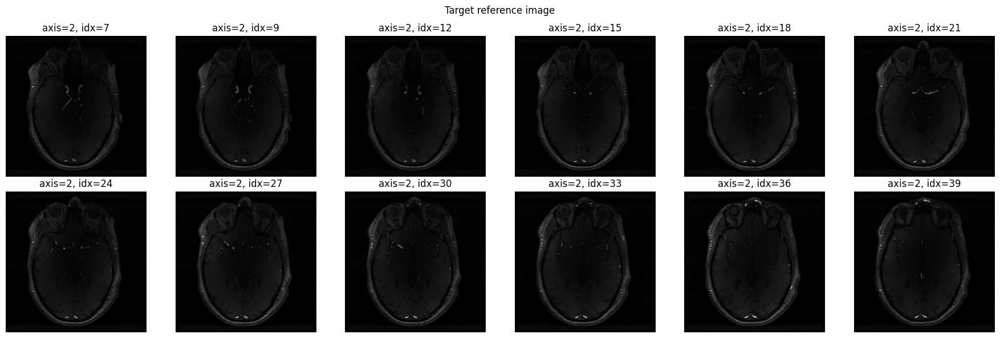

In [27]:
hr_img = nib.load(str(HR_MAG_PATH))
hr_data = np.asarray(hr_img.dataobj, dtype=np.float32)

trg_img_raw = nib.load(str(TARGET_REF_PATH))
trg_data_raw = np.asarray(trg_img_raw.dataobj, dtype=np.float32)
if trg_data_raw.ndim == 4:
    target_3d = trg_data_raw[..., 0].astype(np.float32)
elif trg_data_raw.ndim == 3:
    target_3d = trg_data_raw.astype(np.float32)
else:
    raise ValueError(f"Target must be 3D/4D, got {trg_data_raw.ndim}D")

target_img = make_3d_nifti(target_3d, trg_img_raw)

print("High-res shape:", hr_data.shape)
print("Target shape:", target_3d.shape)
print("High-res zooms:", hr_img.header.get_zooms())
print("Target zooms:", target_img.header.get_zooms())

plot_slice_grid(target_3d, "Target reference image", axis=2, n=12)


## Step 5 - Build Separate `sum`, `mean`, and `max` Flows


sum shape: (448, 448, 116) min/max: 0.0 1519.0
mean shape: (448, 448, 116) min/max: 0.0 506.3333435058594
max shape: (448, 448, 116) min/max: 0.0 1519.0


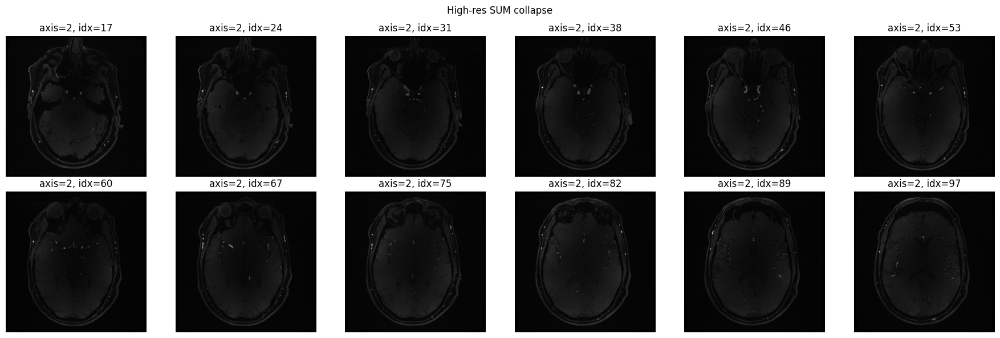

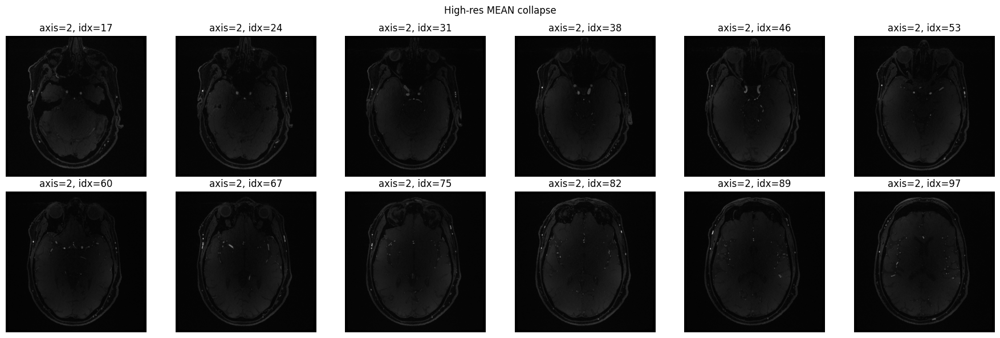

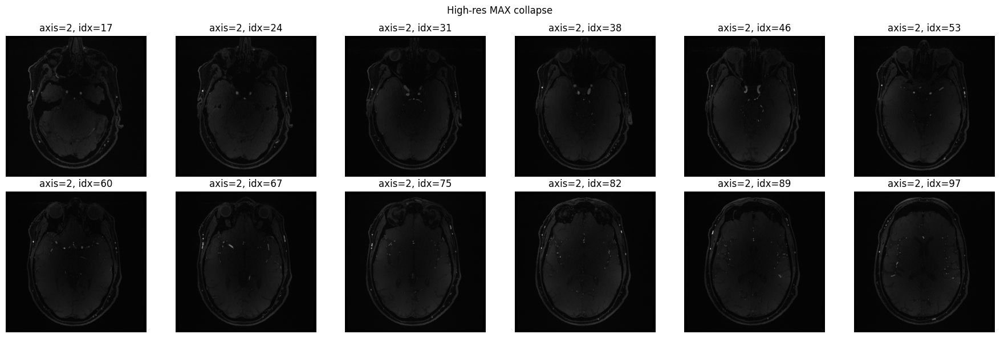

In [28]:
hr_sum = ensure_3d(hr_data, time_axis=HR_TIME_AXIS, collapse="sum")
hr_mean = ensure_3d(hr_data, time_axis=HR_TIME_AXIS, collapse="mean")
hr_max = ensure_3d(hr_data, time_axis=HR_TIME_AXIS, collapse="max")

save_3d(hr_sum, hr_img, OUT_DIR / "sum_highres_3d.nii.gz")
save_3d(hr_mean, hr_img, OUT_DIR / "mean_highres_3d.nii.gz")
save_3d(hr_max, hr_img, OUT_DIR / "max_highres_3d.nii.gz")

print("sum shape:", hr_sum.shape, "min/max:", float(hr_sum.min()), float(hr_sum.max()))
print("mean shape:", hr_mean.shape, "min/max:", float(hr_mean.min()), float(hr_mean.max()))
print("max shape:", hr_max.shape, "min/max:", float(hr_max.min()), float(hr_max.max()))

plot_slice_grid(hr_sum, "High-res SUM collapse", axis=2, n=12)
plot_slice_grid(hr_mean, "High-res MEAN collapse", axis=2, n=12)
plot_slice_grid(hr_max, "High-res MAX collapse", axis=2, n=12)


## Step 6 - Build Brain Masks for `sum`, `mean`, and `max`


Running: hd-bet -i ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sum_for_hdbet.nii.gz -o ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sum_hdbet_mask.nii.gz -device mps

########################
If you are using hd-bet, please cite the following papers:

Isensee F, Schell M, Tursunova I, Brugnara G, Bonekamp D, Neuberger U, Wick A, Schlemmer HP, Heiland S, Wick W, Bendszus M, Maier-Hein KH, Kickingereder P. Automated brain extraction of multi-sequence MRI using artificial neural networks. arXiv preprint arXiv:1901.11341, 2019.

Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
########################

perform_everything_on_device=True is only supported for cuda devices! Setting this to False
There are 1 cases in the source folder
I am processing 0 out of 1 (max process ID is 0, we start counting w

100%|██████████| 4/4 [01:06<00:00, 16.72s/it]


sending off prediction to background worker for resampling and export
done with sum_hdbet_mask_bet.nii.gz


/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/2177015707.py:58: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  m = binary_closing(m, ball(int(MASK_CLOSE_RADIUS)))


Running: hd-bet -i ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/mean_for_hdbet.nii.gz -o ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/mean_hdbet_mask.nii.gz -device mps

########################
If you are using hd-bet, please cite the following papers:

Isensee F, Schell M, Tursunova I, Brugnara G, Bonekamp D, Neuberger U, Wick A, Schlemmer HP, Heiland S, Wick W, Bendszus M, Maier-Hein KH, Kickingereder P. Automated brain extraction of multi-sequence MRI using artificial neural networks. arXiv preprint arXiv:1901.11341, 2019.

Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
########################

perform_everything_on_device=True is only supported for cuda devices! Setting this to False
There are 1 cases in the source folder
I am processing 0 out of 1 (max process ID is 0, we start counting

100%|██████████| 4/4 [01:04<00:00, 16.21s/it]


sending off prediction to background worker for resampling and export
done with mean_hdbet_mask_bet.nii.gz


/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/2177015707.py:58: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  m = binary_closing(m, ball(int(MASK_CLOSE_RADIUS)))


Running: hd-bet -i ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/max_for_hdbet.nii.gz -o ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/max_hdbet_mask.nii.gz -device mps

########################
If you are using hd-bet, please cite the following papers:

Isensee F, Schell M, Tursunova I, Brugnara G, Bonekamp D, Neuberger U, Wick A, Schlemmer HP, Heiland S, Wick W, Bendszus M, Maier-Hein KH, Kickingereder P. Automated brain extraction of multi-sequence MRI using artificial neural networks. arXiv preprint arXiv:1901.11341, 2019.

Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
########################

perform_everything_on_device=True is only supported for cuda devices! Setting this to False
There are 1 cases in the source folder
I am processing 0 out of 1 (max process ID is 0, we start counting w

100%|██████████| 4/4 [01:05<00:00, 16.38s/it]


sending off prediction to background worker for resampling and export
done with max_hdbet_mask_bet.nii.gz


/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/2177015707.py:58: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  m = binary_closing(m, ball(int(MASK_CLOSE_RADIUS)))


Mask sum source: hdbet:sum_hdbet_mask.nii.gz voxels: 6572224
Mask mean source: hdbet:mean_hdbet_mask.nii.gz voxels: 6572225
Mask max source: hdbet:max_hdbet_mask.nii.gz voxels: 6572224


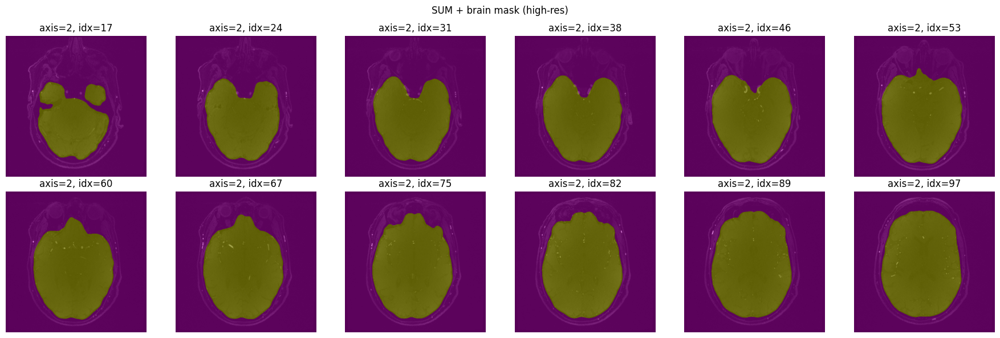

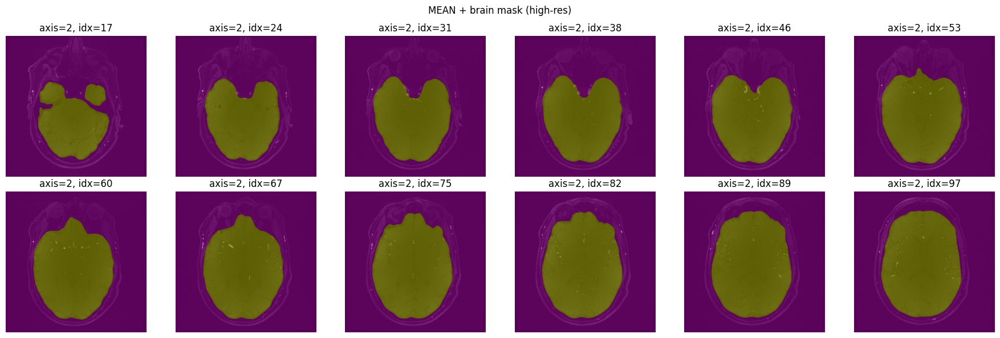

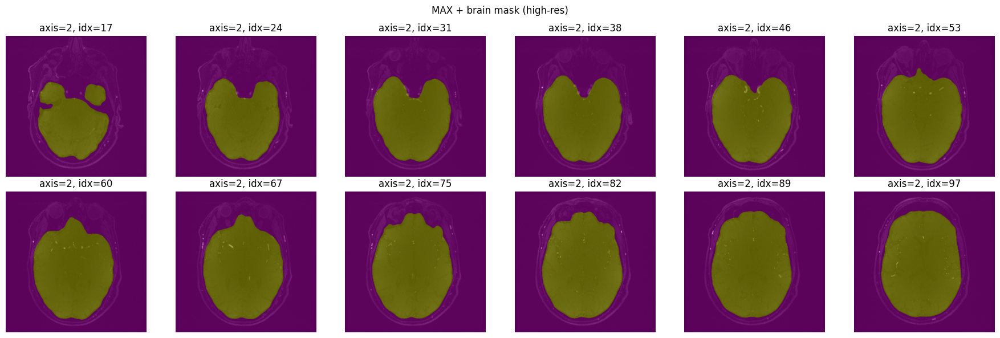

In [13]:
def build_mask(volume, mode_name):
    if MASK_METHOD == "hdbet":
        in_path = OUT_DIR / f"{mode_name}_for_hdbet.nii.gz"
        out_prefix = OUT_DIR / f"{mode_name}_hdbet_mask.nii.gz"
        save_3d(volume, hr_img, in_path)

        if RUN_HDBET:
            if shutil.which(HDBET_COMMAND) is None:
                raise RuntimeError(f"{HDBET_COMMAND} not found in PATH")
            cmd = [
                HDBET_COMMAND,
                "-i", str(in_path),
                "-o", str(out_prefix),
                "-device", HDBET_DEVICE,
            ]
            print("Running:", " ".join(cmd))
            subprocess.run(cmd, check=True)

        mask_path = Path(str(out_prefix))
        if mask_path.exists():
            raw = np.asarray(nib.load(str(mask_path)).dataobj, dtype=np.float32)
            raw = (raw > 0.5).astype(np.float32)
            return postprocess_mask(raw, fast_mode=True), f"hdbet:{mask_path.name}"

        print(f"Mask not found for {mode_name} in HD-BET output. Fallback to Otsu.")

    # Otsu fallback/default
    vals = volume[np.isfinite(volume)]
    vals = vals[vals > 0]
    thr = float(threshold_otsu(vals))
    raw = (volume >= thr).astype(np.float32)
    return postprocess_mask(raw, fast_mode=True), f"otsu_thr={thr:.4f}"


mask_sum, mask_sum_src = build_mask(hr_sum, "sum")
mask_mean, mask_mean_src = build_mask(hr_mean, "mean")
mask_max, mask_max_src = build_mask(hr_max, "max")

save_3d(mask_sum, hr_img, OUT_DIR / "sum_mask_highres.nii.gz")
save_3d(mask_mean, hr_img, OUT_DIR / "mean_mask_highres.nii.gz")
save_3d(mask_max, hr_img, OUT_DIR / "max_mask_highres.nii.gz")

print("Mask sum source:", mask_sum_src, "voxels:", int(np.sum(mask_sum > 0)))
print("Mask mean source:", mask_mean_src, "voxels:", int(np.sum(mask_mean > 0)))
print("Mask max source:", mask_max_src, "voxels:", int(np.sum(mask_max > 0)))

plot_overlay_grid(hr_sum, mask_sum, "SUM + brain mask (high-res)", axis=2, n=12)
plot_overlay_grid(hr_mean, mask_mean, "MEAN + brain mask (high-res)", axis=2, n=12)
plot_overlay_grid(hr_max, mask_max, "MAX + brain mask (high-res)", axis=2, n=12)


## Step 7 - Resample to Match Target Space (Robust)


Resample modes used:
 sum image -> grid_fallback
 mean image -> grid_fallback
 max image -> grid_fallback
 sum mask -> grid_fallback
 mean mask -> grid_fallback
 max mask -> grid_fallback
Target-space mask voxels: sum= 2713924 mean= 2713924 max= 2713924


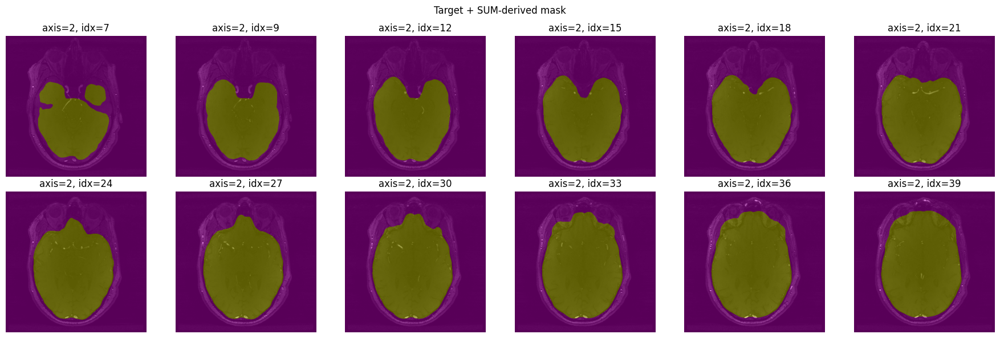

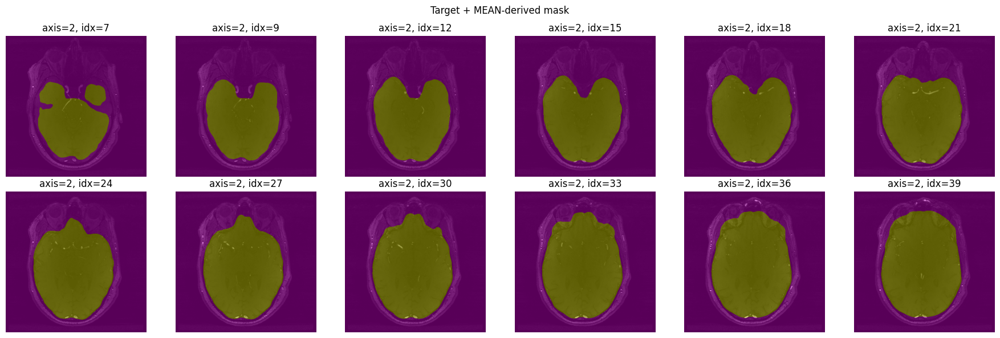

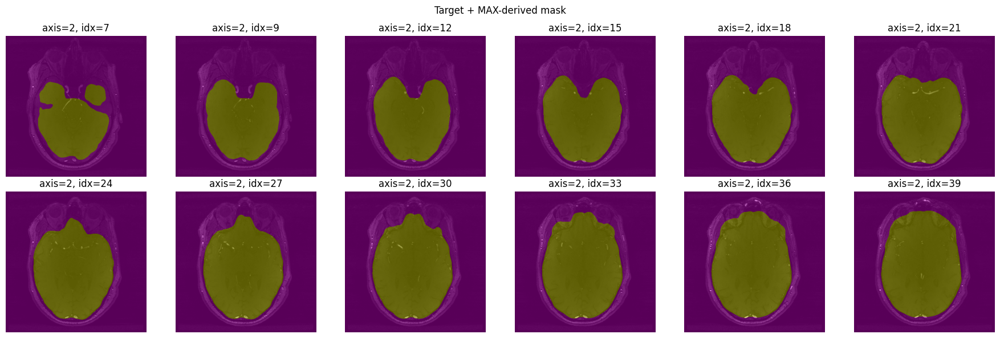

In [14]:
sum_to_target, sum_rs_mode = resample_to_match_robust(hr_sum, hr_img, target_img, order=1, mode=RESAMPLE_MODE)
mean_to_target, mean_rs_mode = resample_to_match_robust(hr_mean, hr_img, target_img, order=1, mode=RESAMPLE_MODE)
max_to_target, max_rs_mode = resample_to_match_robust(hr_max, hr_img, target_img, order=1, mode=RESAMPLE_MODE)

mask_sum_to_target, mask_sum_rs_mode = resample_to_match_robust(mask_sum, hr_img, target_img, order=0, mode=RESAMPLE_MODE)
mask_mean_to_target, mask_mean_rs_mode = resample_to_match_robust(mask_mean, hr_img, target_img, order=0, mode=RESAMPLE_MODE)
mask_max_to_target, mask_max_rs_mode = resample_to_match_robust(mask_max, hr_img, target_img, order=0, mode=RESAMPLE_MODE)

mask_sum_to_target = (mask_sum_to_target > 0.5).astype(np.float32)
mask_mean_to_target = (mask_mean_to_target > 0.5).astype(np.float32)
mask_max_to_target = (mask_max_to_target > 0.5).astype(np.float32)

save_3d(sum_to_target, target_img, OUT_DIR / "sum_targetspace.nii.gz")
save_3d(mean_to_target, target_img, OUT_DIR / "mean_targetspace.nii.gz")
save_3d(max_to_target, target_img, OUT_DIR / "max_targetspace.nii.gz")

save_3d(mask_sum_to_target, target_img, OUT_DIR / "sum_mask_targetspace.nii.gz")
save_3d(mask_mean_to_target, target_img, OUT_DIR / "mean_mask_targetspace.nii.gz")
save_3d(mask_max_to_target, target_img, OUT_DIR / "max_mask_targetspace.nii.gz")

print("Resample modes used:")
print(" sum image ->", sum_rs_mode)
print(" mean image ->", mean_rs_mode)
print(" max image ->", max_rs_mode)
print(" sum mask ->", mask_sum_rs_mode)
print(" mean mask ->", mask_mean_rs_mode)
print(" max mask ->", mask_max_rs_mode)

print(
    "Target-space mask voxels:",
    "sum=", int(np.sum(mask_sum_to_target > 0)),
    "mean=", int(np.sum(mask_mean_to_target > 0)),
    "max=", int(np.sum(mask_max_to_target > 0)),
)

plot_overlay_grid(target_3d, mask_sum_to_target, "Target + SUM-derived mask", axis=2, n=12)
plot_overlay_grid(target_3d, mask_mean_to_target, "Target + MEAN-derived mask", axis=2, n=12)
plot_overlay_grid(target_3d, mask_max_to_target, "Target + MAX-derived mask", axis=2, n=12)


## Step 8 - CoW Candidate Segmentation in High-Resolution, then Map to Target


In [15]:
def segment_cow_candidate(base_vol, mask_vol):
    m = (mask_vol > 0).astype(np.float32)
    x = (base_vol * m).astype(np.float32)
    x_n = robust_norm_in_mask(x, m)

    vf = frangi(x_n, sigmas=SIGMAS, black_ridges=False)
    vs = sato(x_n, sigmas=SIGMAS, black_ridges=False)
    vesselness = ((robust_norm_in_mask(vf.astype(np.float32), m) + robust_norm_in_mask(vs.astype(np.float32), m)) * 0.5).astype(np.float32)

    thr = np.percentile(vesselness[m > 0], PERCENTILE_THRESHOLD)
    b = (vesselness >= thr) & (m > 0)

    b = binary_opening(b, ball(MORPH_RADIUS))
    b = binary_closing(b, ball(MORPH_RADIUS))
    b = remove_small_objects(b.astype(bool), min_size=MIN_COMPONENT_SIZE)

    z0 = int(b.shape[2] * Z_MIN_FRAC)
    z1 = int(b.shape[2] * Z_MAX_FRAC)
    roi = np.zeros_like(b, dtype=bool)
    roi[:, :, z0:z1] = True
    roi &= (m > 0)

    lbl, n = label(b)
    keep = []
    for comp_id in range(1, n + 1):
        comp = (lbl == comp_id)
        if int(np.sum(comp)) < MIN_COMPONENT_SIZE:
            continue
        if np.any(comp & roi):
            keep.append(comp_id)

    if len(keep) == 0:
        seg = b.astype(np.float32)
    else:
        seg = np.isin(lbl, keep).astype(np.float32)

    return vesselness, seg, roi.astype(np.float32), float(thr)


# Segment in high-resolution space
vess_sum_hr, seg_sum_hr, roi_sum_hr, thr_sum = segment_cow_candidate(hr_sum, mask_sum)
vess_mean_hr, seg_mean_hr, roi_mean_hr, thr_mean = segment_cow_candidate(hr_mean, mask_mean)
vess_max_hr, seg_max_hr, roi_max_hr, thr_max = segment_cow_candidate(hr_max, mask_max)

# Save high-resolution segmentation outputs
save_3d(vess_sum_hr, hr_img, OUT_DIR / "sum_vesselness_highres.nii.gz")
save_3d(seg_sum_hr, hr_img, OUT_DIR / "sum_cow_seg_highres.nii.gz")
save_3d(vess_mean_hr, hr_img, OUT_DIR / "mean_vesselness_highres.nii.gz")
save_3d(seg_mean_hr, hr_img, OUT_DIR / "mean_cow_seg_highres.nii.gz")
save_3d(vess_max_hr, hr_img, OUT_DIR / "max_vesselness_highres.nii.gz")
save_3d(seg_max_hr, hr_img, OUT_DIR / "max_cow_seg_highres.nii.gz")

# Map segmentation outputs to target space
seg_sum_target, seg_sum_rs_mode = resample_to_match_robust(seg_sum_hr, hr_img, target_img, order=0, mode=RESAMPLE_MODE)
seg_mean_target, seg_mean_rs_mode = resample_to_match_robust(seg_mean_hr, hr_img, target_img, order=0, mode=RESAMPLE_MODE)
seg_max_target, seg_max_rs_mode = resample_to_match_robust(seg_max_hr, hr_img, target_img, order=0, mode=RESAMPLE_MODE)

seg_sum_target = (seg_sum_target > 0.5).astype(np.float32)
seg_mean_target = (seg_mean_target > 0.5).astype(np.float32)
seg_max_target = (seg_max_target > 0.5).astype(np.float32)

save_3d(seg_sum_target, target_img, OUT_DIR / "sum_cow_seg_targetspace.nii.gz")
save_3d(seg_mean_target, target_img, OUT_DIR / "mean_cow_seg_targetspace.nii.gz")
save_3d(seg_max_target, target_img, OUT_DIR / "max_cow_seg_targetspace.nii.gz")

print("Segmentation resample modes:")
print(" sum seg ->", seg_sum_rs_mode)
print(" mean seg ->", seg_mean_rs_mode)
print(" max seg ->", seg_max_rs_mode)

print(f"SUM threshold p{PERCENTILE_THRESHOLD}: {thr_sum:.6f}, highres_vox={int(np.sum(seg_sum_hr > 0))}, target_vox={int(np.sum(seg_sum_target > 0))}")
print(f"MEAN threshold p{PERCENTILE_THRESHOLD}: {thr_mean:.6f}, highres_vox={int(np.sum(seg_mean_hr > 0))}, target_vox={int(np.sum(seg_mean_target > 0))}")
print(f"MAX threshold p{PERCENTILE_THRESHOLD}: {thr_max:.6f}, highres_vox={int(np.sum(seg_max_hr > 0))}, target_vox={int(np.sum(seg_max_target > 0))}")



/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:13: FutureWarning: `binary_opening` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.opening` instead.
  b = binary_opening(b, ball(MORPH_RADIUS))
/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:14: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  b = binary_closing(b, ball(MORPH_RADIUS))
/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:15: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed small

Segmentation resample modes:
 sum seg -> grid_fallback
 mean seg -> grid_fallback
 max seg -> grid_fallback
SUM threshold p98.8: 0.760415, highres_vox=14134, target_vox=5704
MEAN threshold p98.8: 0.760415, highres_vox=14134, target_vox=5704
MAX threshold p98.8: 0.760415, highres_vox=14134, target_vox=5704


## Step 9 - Visual QC: High-Resolution Segmentation and Target-Space Overlay


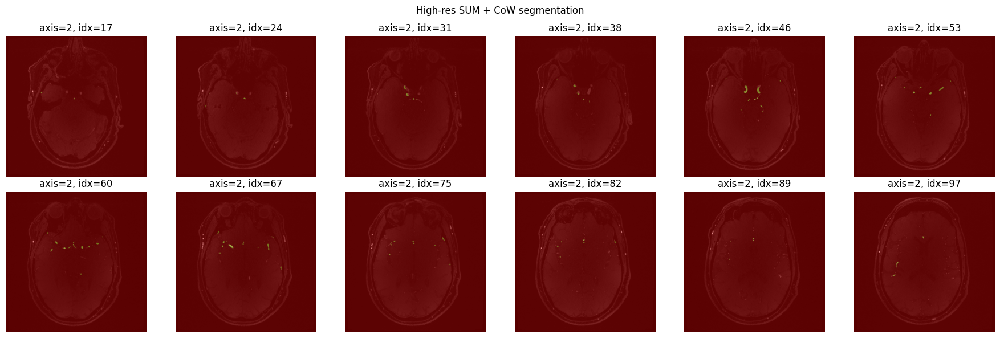

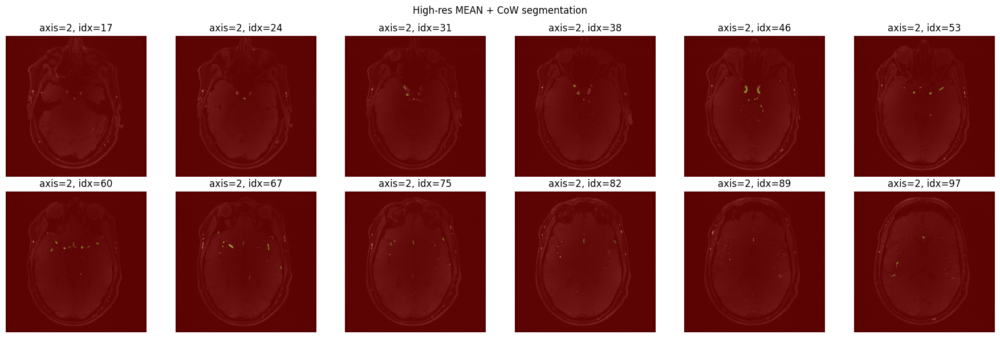

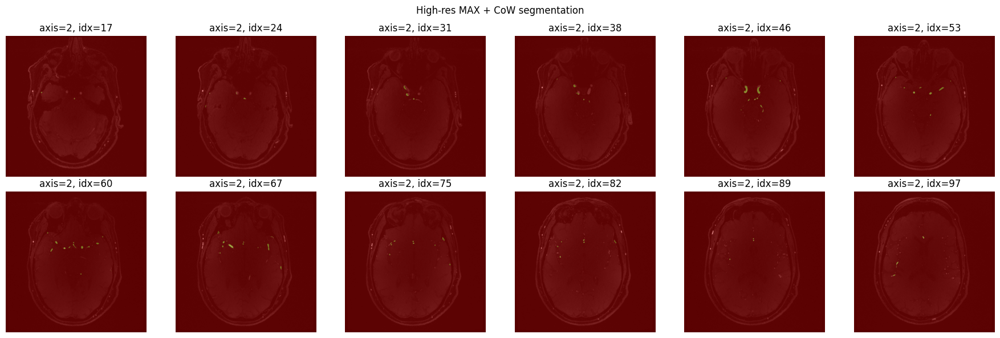

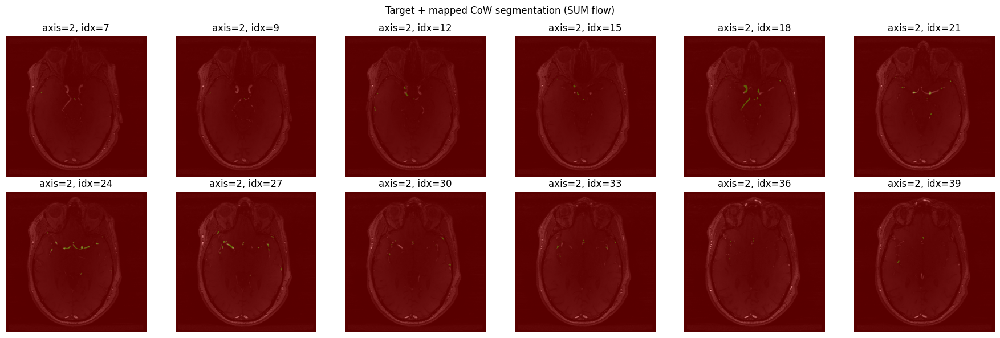

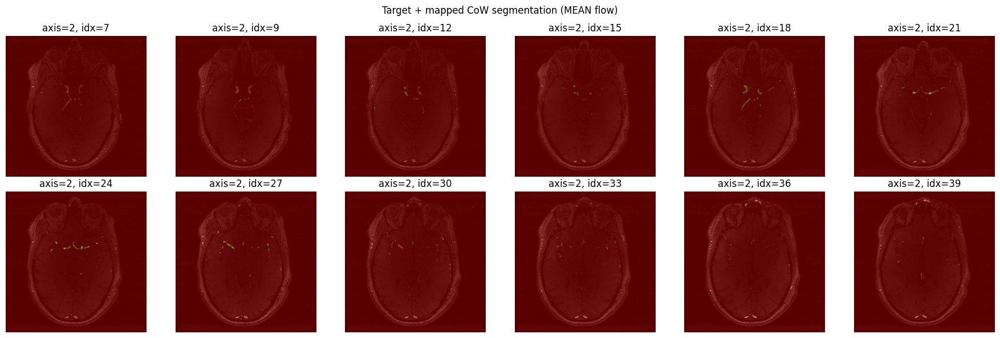

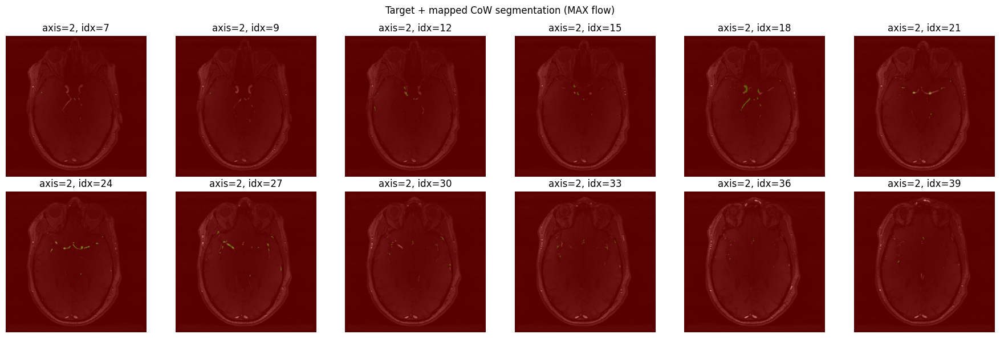

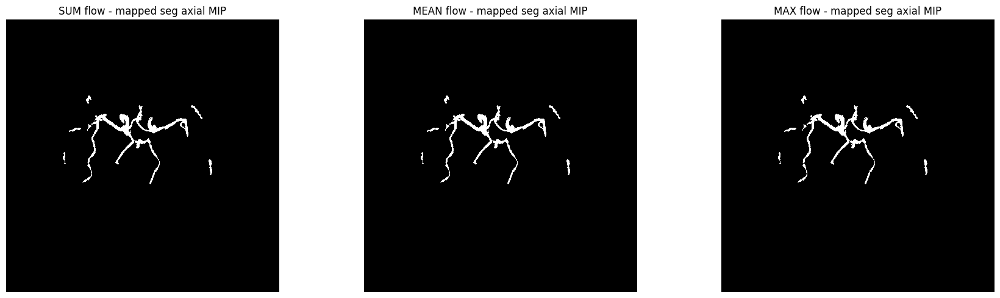

In [16]:
# High-resolution QC
plot_overlay_grid(hr_sum, seg_sum_hr, "High-res SUM + CoW segmentation", axis=2, n=12, overlay_cmap="autumn")
plot_overlay_grid(hr_mean, seg_mean_hr, "High-res MEAN + CoW segmentation", axis=2, n=12, overlay_cmap="autumn")
plot_overlay_grid(hr_max, seg_max_hr, "High-res MAX + CoW segmentation", axis=2, n=12, overlay_cmap="autumn")

# Target-space overlays (mapped segmentation)
plot_overlay_grid(target_3d, seg_sum_target, "Target + mapped CoW segmentation (SUM flow)", axis=2, n=12, overlay_cmap="autumn")
plot_overlay_grid(target_3d, seg_mean_target, "Target + mapped CoW segmentation (MEAN flow)", axis=2, n=12, overlay_cmap="autumn")
plot_overlay_grid(target_3d, seg_max_target, "Target + mapped CoW segmentation (MAX flow)", axis=2, n=12, overlay_cmap="autumn")

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow(np.max(seg_sum_target, axis=2).T, cmap="gray", origin="lower")
plt.title("SUM flow - mapped seg axial MIP")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(np.max(seg_mean_target, axis=2).T, cmap="gray", origin="lower")
plt.title("MEAN flow - mapped seg axial MIP")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(np.max(seg_max_target, axis=2).T, cmap="gray", origin="lower")
plt.title("MAX flow - mapped seg axial MIP")
plt.axis("off")

plt.tight_layout()
plt.show()



## Step 10 - Pick Best Flow and Export Final Target-Space Outputs


In [ ]:
# Selection rule can be changed. Current: larger CoW candidate volume in target space.
flow_voxels = {
    "sum": int(np.sum(seg_sum_target > 0)),
    "mean": int(np.sum(seg_mean_target > 0)),
    "max": int(np.sum(seg_max_target > 0)),
}

best_flow = max(flow_voxels, key=flow_voxels.get)
print("Flow voxels (target space):", flow_voxels)
print("Best flow:", best_flow)

if best_flow == "sum":
    best_mask = mask_sum_to_target
    best_seg = seg_sum_target
elif best_flow == "mean":
    best_mask = mask_mean_to_target
    best_seg = seg_mean_target
else:
    best_mask = mask_max_to_target
    best_seg = seg_max_target

save_3d(best_mask, target_img, OUT_DIR / "best_brain_mask_targetspace.nii.gz")
save_3d(best_seg, target_img, OUT_DIR / "best_cow_seg_targetspace.nii.gz")

print("Saved final target-space outputs in:", OUT_DIR)



## Step 11 - SUM-Only End-to-End Section

This section runs the complete workflow using only the `sum` collapse:
1. build SUM high-res image,
2. build SUM mask,
3. segment CoW in high-resolution,
4. map mask/segmentation to target space,
5. export SUM-only final outputs.


In [29]:
# SUM-only high-res image
sum_only_hr = ensure_3d(hr_data, time_axis=HR_TIME_AXIS, collapse="sum")
save_3d(sum_only_hr, hr_img, OUT_DIR / "sum_only_highres_3d.nii.gz")

# SUM-only mask
sum_only_mask, sum_only_mask_src = build_mask(sum_only_hr, "sum_only")
save_3d(sum_only_mask, hr_img, OUT_DIR / "sum_only_mask_highres.nii.gz")

# Segment in high-resolution (SUM-only)
sum_only_vesselness_hr, sum_only_seg_hr, sum_only_roi_hr, sum_only_thr = segment_cow_candidate(sum_only_hr, sum_only_mask)
save_3d(sum_only_vesselness_hr, hr_img, OUT_DIR / "sum_only_vesselness_highres.nii.gz")
save_3d(sum_only_seg_hr, hr_img, OUT_DIR / "sum_only_cow_seg_highres.nii.gz")
save_3d(sum_only_roi_hr, hr_img, OUT_DIR / "sum_only_cow_roi_highres.nii.gz")

# Map to target space
sum_only_mask_target, sum_only_mask_rs_mode = resample_to_match_robust(sum_only_mask, hr_img, target_img, order=0, mode=RESAMPLE_MODE)
sum_only_seg_target, sum_only_seg_rs_mode = resample_to_match_robust(sum_only_seg_hr, hr_img, target_img, order=0, mode=RESAMPLE_MODE)

sum_only_mask_target = (sum_only_mask_target > 0.5).astype(np.float32)
sum_only_seg_target = (sum_only_seg_target > 0.5).astype(np.float32)

save_3d(sum_only_mask_target, target_img, OUT_DIR / "sum_only_mask_targetspace.nii.gz")
save_3d(sum_only_seg_target, target_img, OUT_DIR / "sum_only_cow_seg_targetspace.nii.gz")

# SUM-only canonical outputs
save_3d(sum_only_mask_target, target_img, OUT_DIR / "final_sum_brain_mask_targetspace.nii.gz")
save_3d(sum_only_seg_target, target_img, OUT_DIR / "final_sum_cow_seg_targetspace.nii.gz")

print("SUM-only mask source:", sum_only_mask_src)
print("SUM-only threshold:", float(sum_only_thr))
print("SUM-only resample modes: mask=", sum_only_mask_rs_mode, ", seg=", sum_only_seg_rs_mode)
print("SUM-only voxels: highres_seg=", int(np.sum(sum_only_seg_hr > 0)), ", target_seg=", int(np.sum(sum_only_seg_target > 0)))


Running: hd-bet -i ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sum_only_for_hdbet.nii.gz -o ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sum_only_hdbet_mask.nii.gz -device mps

########################
If you are using hd-bet, please cite the following papers:

Isensee F, Schell M, Tursunova I, Brugnara G, Bonekamp D, Neuberger U, Wick A, Schlemmer HP, Heiland S, Wick W, Bendszus M, Maier-Hein KH, Kickingereder P. Automated brain extraction of multi-sequence MRI using artificial neural networks. arXiv preprint arXiv:1901.11341, 2019.

Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
########################

perform_everything_on_device=True is only supported for cuda devices! Setting this to False
There are 1 cases in the source folder
I am processing 0 out of 1 (max process ID is 0, we start 

100%|██████████| 4/4 [01:06<00:00, 16.61s/it]


sending off prediction to background worker for resampling and export
done with sum_only_hdbet_mask_bet.nii.gz


/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/2177015707.py:58: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  m = binary_closing(m, ball(int(MASK_CLOSE_RADIUS)))
/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:13: FutureWarning: `binary_opening` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.opening` instead.
  b = binary_opening(b, ball(MORPH_RADIUS))
/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:14: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  b = binary_closing(b, ball(MORPH_RADIUS))
/var/folders/b5/0mc1_5sn3fnfc23rbdcrvj140000gn/T/ipykernel_16942/447939420.py:15: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0

SUM-only mask source: hdbet:sum_only_hdbet_mask.nii.gz
SUM-only threshold: 0.7604151964187622
SUM-only resample modes: mask= grid_fallback , seg= grid_fallback
SUM-only voxels: highres_seg= 14134 , target_seg= 5704


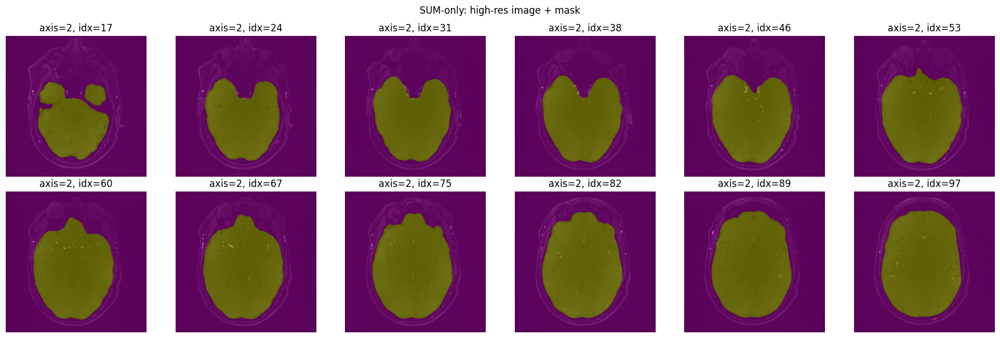

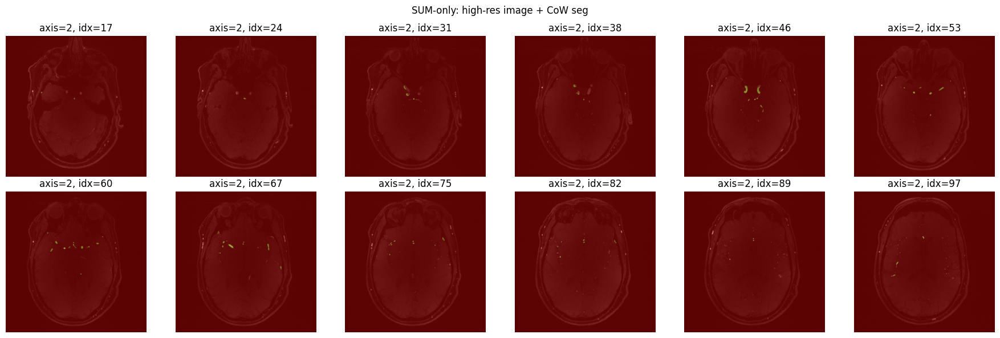

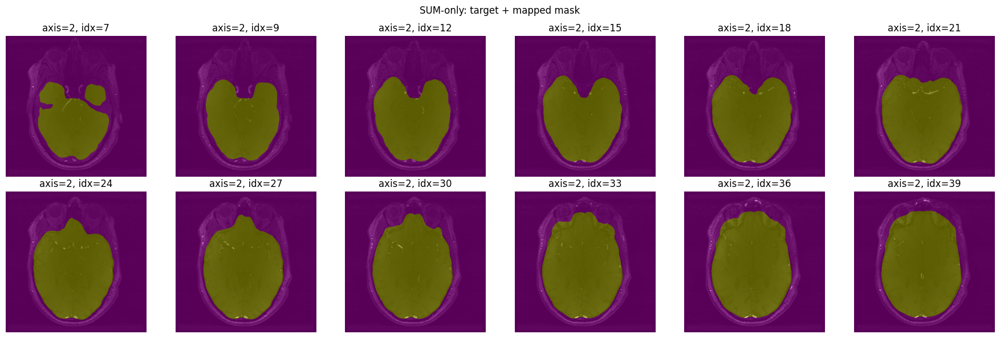

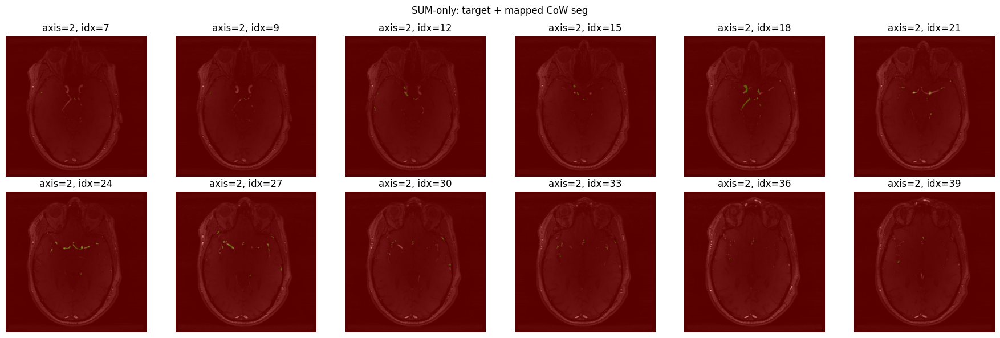

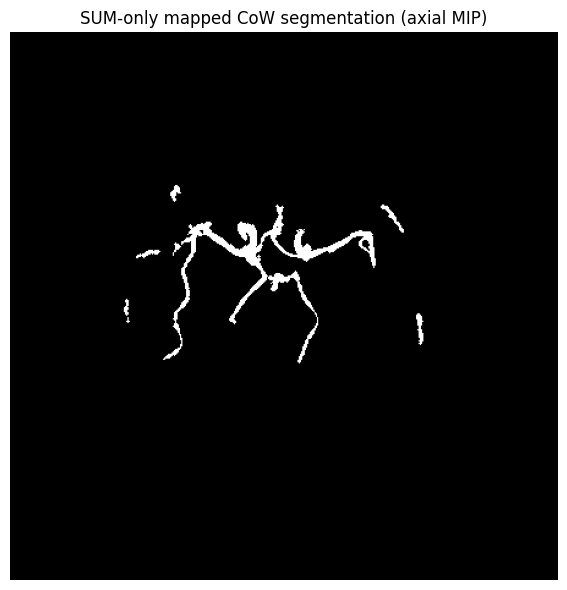

In [30]:
# SUM-only QC
plot_overlay_grid(sum_only_hr, sum_only_mask, "SUM-only: high-res image + mask", axis=2, n=12)
plot_overlay_grid(sum_only_hr, sum_only_seg_hr, "SUM-only: high-res image + CoW seg", axis=2, n=12, overlay_cmap="autumn")

plot_overlay_grid(target_3d, sum_only_mask_target, "SUM-only: target + mapped mask", axis=2, n=12)
plot_overlay_grid(target_3d, sum_only_seg_target, "SUM-only: target + mapped CoW seg", axis=2, n=12, overlay_cmap="autumn")

plt.figure(figsize=(6, 6))
plt.imshow(np.max(sum_only_seg_target, axis=2).T, cmap="gray", origin="lower")
plt.title("SUM-only mapped CoW segmentation (axial MIP)")
plt.axis("off")
plt.tight_layout()
plt.show()


## Step 12 - SDM Method (Rothenberger-style) Adapted to This Repository

This section adapts SDM segmentation to your data conventions:
- supports `Vx/Vy/Vz` as 3D or 4D NIfTI,
- detects RAW phase-like ranges and converts to m/s,
- applies repository sign convention (`Vx`, `Vy` inverted; `Vz` not inverted),
- runs iterative SDM/F-test segmentation,
- saves CoW mask in the same space as velocity inputs.


In [40]:
from scipy.stats import f

# SDM input paths (set these to the velocity volume you want)
SDM_VX_PATH = Path(f"../data/processed_inputs/{HR_PATIENT_ID}/Vx.nii.gz")
SDM_VY_PATH = Path(f"../data/processed_inputs/{HR_PATIENT_ID}/Vy.nii.gz")
SDM_VZ_PATH = Path(f"../data/processed_inputs/{HR_PATIENT_ID}/Vz.nii.gz")

# If your velocity files are 4D, this is the temporal axis
SDM_TIME_AXIS = -1

# RAW conversion settings (same logic as repo)
SDM_AUTO_CONVERT_RAW = True
SDM_VENC = 0.90
SDM_VENC_U = SDM_VENC
SDM_VENC_V = SDM_VENC
SDM_VENC_W = SDM_VENC

# SDM segmentation settings
SDM_P_CRIT = 0.1
SDM_MAX_ITERS = 20
SDM_CONVERGENCE_VOX = 10
SDM_KEEP_LARGEST_CC = True
SDM_INIT_PERCENTILE = 90.0  # high-percentile bootstrap to avoid huge initial mask
SDM_BG_QUANTILE = 70.0  # use low-SDM background tail for robust sigma estimate
SDM_MIN_BG_VOXELS = 500
SDM_MIN_MASK_VOXELS = 200

# Optional brain mask constraint in velocity space
# If None, SDM runs on full volume.
SDM_MASK_PATH = "../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sum_only_mask_targetspace.nii.gz"
SDM_MASK_THRESHOLD = 0.5

SDM_OUT_PATH = OUT_DIR / "sdm_cow_seg_velocity_space.nii.gz"

for path in [SDM_VX_PATH, SDM_VY_PATH, SDM_VZ_PATH]:
    assert path.exists(), f"Missing SDM input: {path}"


In [41]:
def ensure_time_last_4d(arr, time_axis=-1):
    if arr.ndim == 3:
        return arr[..., np.newaxis]
    if arr.ndim != 4:
        raise ValueError(f"Expected 3D/4D, got {arr.ndim}D")
    resolved = time_axis if time_axis >= 0 else arr.ndim + time_axis
    if resolved != 3:
        arr = np.moveaxis(arr, resolved, 3)
    return arr


def looks_like_raw_phase(values):
    mn = float(np.min(values))
    mx = float(np.max(values))
    is_unsigned_raw = mn >= 0.0 and mx > 1000.0 and mx <= 8192.0
    max_abs = max(abs(mn), abs(mx))
    centered_ratio = abs(mx + mn) / (max_abs + 1e-6)
    is_signed_raw = mn < -500.0 and mx > 500.0 and max_abs <= 8192.0 and centered_ratio < 0.25
    return is_unsigned_raw or is_signed_raw


def convert_raw_to_velocity_repo(values, venc, invert_sign=False, label="component"):
    arr = values.astype(np.float32)
    if not SDM_AUTO_CONVERT_RAW:
        return arr

    if not looks_like_raw_phase(arr):
        return arr

    if venc is None or venc <= 0:
        raise ValueError(f"Invalid VENC for {label}: {venc}")

    mn = float(np.min(arr))
    mx = float(np.max(arr))
    if mn >= 0.0:
        arr = (arr - 2048.0) / 2048.0 * float(venc)
    else:
        max_abs = max(abs(mn), abs(mx))
        scale = 4096.0 if max_abs > 3000.0 else 2048.0
        arr = arr / scale * float(venc)

    if invert_sign:
        arr = -arr

    return arr.astype(np.float32)


def sdm_segmentation_repo(vx_path, vy_path, vz_path, output_path):
    vx_img = nib.load(str(vx_path))
    vy_img = nib.load(str(vy_path))
    vz_img = nib.load(str(vz_path))

    vx = ensure_time_last_4d(np.asarray(vx_img.dataobj, dtype=np.float32), SDM_TIME_AXIS)
    vy = ensure_time_last_4d(np.asarray(vy_img.dataobj, dtype=np.float32), SDM_TIME_AXIS)
    vz = ensure_time_last_4d(np.asarray(vz_img.dataobj, dtype=np.float32), SDM_TIME_AXIS)

    if not (vx.shape == vy.shape == vz.shape):
        raise ValueError(f"Shape mismatch: Vx={vx.shape}, Vy={vy.shape}, Vz={vz.shape}")

    # RAW -> velocity conversion with repo sign convention
    vx = convert_raw_to_velocity_repo(vx, SDM_VENC_U, invert_sign=True, label="Vx/U")
    vy = convert_raw_to_velocity_repo(vy, SDM_VENC_V, invert_sign=True, label="Vy/V")
    vz = convert_raw_to_velocity_repo(vz, SDM_VENC_W, invert_sign=False, label="Vz/W")

    n_frames = vx.shape[-1]
    if n_frames < 2:
        raise ValueError(f"SDM needs temporal variation; detected frames={n_frames}")

    # Temporal stats per component
    mu_x, mu_y, mu_z = np.mean(vx, axis=-1), np.mean(vy, axis=-1), np.mean(vz, axis=-1)
    std_x, std_y, std_z = np.std(vx, axis=-1), np.std(vy, axis=-1), np.std(vz, axis=-1)

    eps = 1e-6
    std_x += eps
    std_y += eps
    std_z += eps

    sqrt_n = np.sqrt(float(n_frames))

    # Initial SDM assumes background mean 0
    sdm_x = mu_x / (std_x / sqrt_n)
    sdm_y = mu_y / (std_y / sqrt_n)
    sdm_z = mu_z / (std_z / sqrt_n)
    sdm_mag_sq = sdm_x**2 + sdm_y**2 + sdm_z**2

    if SDM_MASK_PATH is not None:
        m_img = nib.load(str(SDM_MASK_PATH))
        m = np.asarray(m_img.dataobj, dtype=np.float32)
        if m.ndim == 4:
            m = m[..., 0]
        if m.shape != sdm_mag_sq.shape:
            m_nii = make_3d_nifti(m, m_img)
            tgt = make_3d_nifti(sdm_mag_sq.astype(np.float32), vx_img)
            m_rs = nibproc.resample_from_to(m_nii, (tgt.shape, tgt.affine), order=0)
            m = np.asarray(m_rs.dataobj, dtype=np.float32)
        mask_constraint = m > SDM_MASK_THRESHOLD
    else:
        mask_constraint = np.ones_like(sdm_mag_sq, dtype=bool)

    mask = np.zeros_like(sdm_mag_sq, dtype=bool)
    init_thr = np.percentile(sdm_mag_sq[mask_constraint], SDM_INIT_PERCENTILE)
    mask = (sdm_mag_sq > init_thr) & mask_constraint
    print(f"SDM init: percentile={SDM_INIT_PERCENTILE}, voxels={int(np.sum(mask))}")

    for it in range(SDM_MAX_ITERS):
        prev_count = int(np.sum(mask))

        bg = (~mask) & mask_constraint
        n_bg = int(np.sum(bg))
        if n_bg < SDM_MIN_BG_VOXELS:
            print(f"SDM stop: too few background voxels ({n_bg}).")
            break

        # Estimate background mean per component from current background
        mu_bg_x = float(np.mean(mu_x[bg]))
        mu_bg_y = float(np.mean(mu_y[bg]))
        mu_bg_z = float(np.mean(mu_z[bg]))

        sdm_x = (mu_x - mu_bg_x) / (std_x / sqrt_n)
        sdm_y = (mu_y - mu_bg_y) / (std_y / sqrt_n)
        sdm_z = (mu_z - mu_bg_z) / (std_z / sqrt_n)
        sdm_mag_sq = sdm_x**2 + sdm_y**2 + sdm_z**2

        bg_vals = sdm_mag_sq[bg]
        q = float(np.percentile(bg_vals, SDM_BG_QUANTILE))
        bg_robust = bg_vals[bg_vals <= q]
        if bg_robust.size < 50:
            print(f"SDM stop: robust background too small ({bg_robust.size}).")
            break

        sigma_bg_sq = float(np.var(bg_robust)) + eps
        f_stat = sdm_mag_sq / sigma_bg_sq
        p_vals = f.sf(f_stat, dfn=3, dfd=max(10, int(bg_robust.size) - 1))

        new_mask = (p_vals < SDM_P_CRIT) & mask_constraint

        new_count = int(np.sum(new_mask))
        diff = abs(new_count - prev_count)
        print(f"SDM iter {it+1}: voxels={new_count}, change={diff}, sigma_bg={sigma_bg_sq:.4e}")
        if new_count < SDM_MIN_MASK_VOXELS:
            print(f"SDM stop: collapse guard triggered ({new_count} < {SDM_MIN_MASK_VOXELS}).")
            break

        mask = new_mask
        if diff < SDM_CONVERGENCE_VOX:
            print("SDM converged.")
            break

    # Post-processing: largest connected component
    if SDM_KEEP_LARGEST_CC:
        lbl, n_lbl = label(mask)
        if n_lbl > 0:
            largest = np.argmax(np.bincount(lbl.flat)[1:]) + 1
            mask = lbl == largest

    out = nib.Nifti1Image(mask.astype(np.uint8), vx_img.affine, vx_img.header)
    nib.save(out, str(output_path))
    return mask.astype(np.float32), vx_img


sdm_seg, sdm_ref_img = sdm_segmentation_repo(SDM_VX_PATH, SDM_VY_PATH, SDM_VZ_PATH, SDM_OUT_PATH)
print("Saved SDM segmentation:", SDM_OUT_PATH)
print("SDM voxels:", int(np.sum(sdm_seg > 0)))


SDM init: percentile=90.0, voxels=271393
SDM iter 1: voxels=66740, change=204653, sigma_bg=2.5094e+02
SDM iter 2: voxels=38433, change=28307, sigma_bg=3.7995e+02
SDM iter 3: voxels=32933, change=5500, sigma_bg=4.0073e+02
SDM iter 4: voxels=31949, change=984, sigma_bg=4.0468e+02
SDM iter 5: voxels=31766, change=183, sigma_bg=4.0539e+02
SDM iter 6: voxels=31732, change=34, sigma_bg=4.0552e+02
SDM iter 7: voxels=31723, change=9, sigma_bg=4.0555e+02
SDM converged.
Saved SDM segmentation: ../data/temporal_mip_tests/highres_step_by_step/001_20240313_7T/sdm_cow_seg_velocity_space.nii.gz
SDM voxels: 2574


## Step 13 - SDM Visual QC and Optional Mapping to Target


In [ ]:
# QC in velocity space (SDM output)
sdm_base_img = nib.load(str(SDM_VX_PATH))
sdm_base = np.asarray(sdm_base_img.dataobj, dtype=np.float32)
if sdm_base.ndim == 4:
    sdm_base = sdm_base[..., 0]

plot_overlay_grid(sdm_base, sdm_seg, "SDM segmentation over Vx (velocity space)", axis=2, n=12, overlay_cmap="autumn")

# Optional: map SDM segmentation to the notebook target image space
sdm_target, sdm_rs_mode = resample_to_match_robust(sdm_seg, sdm_ref_img, target_img, order=0, mode=RESAMPLE_MODE)
sdm_target = (sdm_target > 0.5).astype(np.float32)

save_3d(sdm_target, target_img, OUT_DIR / "sdm_cow_seg_targetspace.nii.gz")

print("SDM target-space resample mode:", sdm_rs_mode)
print("SDM target voxels:", int(np.sum(sdm_target > 0)))

plot_overlay_grid(target_3d, sdm_target, "SDM mapped segmentation over target", axis=2, n=12, overlay_cmap="autumn")


## Notes

- `build_mask` uses HD-BET prefix/output handling compatible with `hd-bet -o <prefix>`.
- Mask post-processing runs in `fast_mode=True` by default for speed on large volumes.
- This notebook evaluates `sum`, `mean`, and `max`.
- CoW segmentation is computed in high-resolution first, then mapped to target space.
- `RESAMPLE_MODE="auto"` uses world-space resample first and falls back to orientation-aware grid resample if collapse is detected.
- You can swap `TARGET_REF_PATH` to the exact magnitude or velocity volume used downstream.
- Step 11 provides a SUM-only end-to-end section.
- Steps 12-13 add SDM segmentation adapted to RAW phase conversion and repo sign conventions.
